# Computational UI Attention: Scalable Design Evaluation

**HCI + L Laboratory** — Yerevan State University / Northwestern University

This notebook demonstrates how deep learning attention models can predict where users look on a UI screenshot — without any eye-tracking hardware.

**Screenshots analysed:** Three Armenian bank websites (Ardshinbank, Acba Bank, Ameriabank)

**Models used:**
1. **ViT** (Vision Transformer) — attention rollout from self-attention layers
2. **CLIP** (Contrastive Language-Image Pre-training) — attention from visual encoder guided by text query
3. **DINOv2** (Meta, self-supervised ViT) — CLS-to-patch attention from self-supervised pre-training
4. **DeepGaze IIE** (Linardos et al., ICCV 2021) — human fixation prediction trained on eye-tracking data
5. **Multimodal Fusion** — equal-weight combination of all four models above

**Metrics computed:**
- CTA Saliency Score, Component Coverage, Visual Hierarchy Agreement, Top-Heavy Ratio, Attention Entropy

**Requirements:**
```
pip install torch torchvision transformers deepgaze-pytorch Pillow matplotlib numpy scipy
```

In [42]:
import numpy as np
from PIL import Image
from pathlib import Path


def _import_torch():
    import torch
    return torch


def _import_models():
    import torch
    from transformers import (
        ViTModel, ViTImageProcessor,
        CLIPModel, CLIPProcessor,
    )
    return torch, ViTModel, ViTImageProcessor, CLIPModel, CLIPProcessor

In [43]:
# ── Presentation Style Configuration ──────────────────────────
import matplotlib.pyplot as plt
import matplotlib as mpl

STYLE = {
    # Background & surface
    "bg":           "#0a1a2e",
    "surface":      "#0c1a2e",
    "surface_alt":  "#12243e",
    "border":       "#1a3358",
    # Text
    "title":        "#f5f1e8",
    "subtitle":     "#f0d080",
    "accent":       "#3eb8b0",
    "text":         "#c8c2b4",
    "text_dim":     "#6a6a8a",
    # Data colors
    "blue":         "#3b82f6",
    "green":        "#10b981",
    "amber":        "#f59e0b",
    "red":          "#ef4444",
    # Heatmap
    "cmap":         "inferno",
    "overlay_alpha": 0.55,
    # Fonts
    "title_size":   20,
    "subtitle_size": 16,
    "label_size":   14,
    "table_size":   13,
    "tick_size":    11,
    "font_family":  "serif",
    # Figure
    "dpi":          150,
}

def setup_style():
    """Apply global matplotlib style for presentation-quality output."""
    mpl.rcParams.update({
        "figure.facecolor":   STYLE["bg"],
        "axes.facecolor":     STYLE["surface"],
        "axes.edgecolor":     STYLE["border"],
        "axes.labelcolor":    STYLE["text"],
        "text.color":         STYLE["title"],
        "xtick.color":        STYLE["text_dim"],
        "ytick.color":        STYLE["text_dim"],
        "grid.color":         STYLE["border"],
        "grid.linewidth":     0.5,
        "font.family":        STYLE["font_family"],
        "font.size":          STYLE["label_size"],
        "figure.dpi":         STYLE["dpi"],
        "savefig.dpi":        STYLE["dpi"],
        "savefig.facecolor":  STYLE["bg"],
    })

setup_style()
print("Presentation style configured.")

Presentation style configured.


## 1. Configuration & Image Loading

Load the three bank website screenshots for side-by-side comparison.

In [44]:
# ── Configuration ──────────────────────────────────────────────
DATA_DIR   = Path("../data/raw/web_page examples")
TEXT_QUERY = "important information and call to action"
DEVICE     = "cpu"  # "cpu" or "cuda"

IMAGE_PATHS = sorted(DATA_DIR.glob("screenshot_*.png"))
LABELS = ["Ardshinbank", "Acba Bank", "Ameriabank"]

# ── Load images ────────────────────────────────────────────────
images = {}
for path, label in zip(IMAGE_PATHS, LABELS):
    img = Image.open(path).convert("RGB")
    images[label] = img
    print(f"Loaded {label}: {path.name}  ({img.size[0]}x{img.size[1]})")

print(f"\nText query: {TEXT_QUERY}")
print(f"Device: {DEVICE}")
print(f"Screenshots: {len(images)}")

Loaded Ardshinbank: screenshot_1.png  (2564x1227)
Loaded Acba Bank: screenshot_2.png  (2564x1227)
Loaded Ameriabank: screenshot_3.png  (2564x1227)

Text query: important information and call to action
Device: cpu
Screenshots: 3


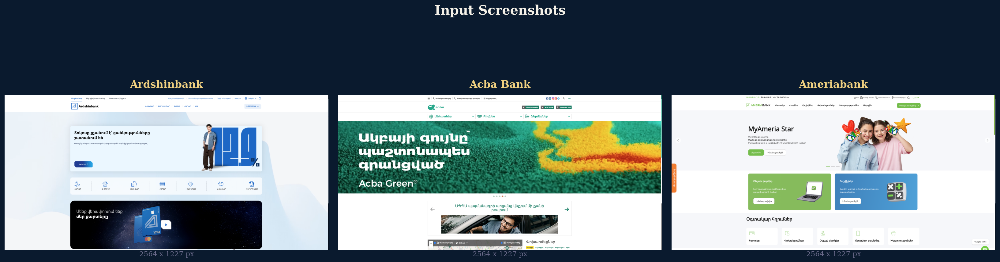

In [45]:
fig, axes = plt.subplots(1, 3, figsize=(22, 7))
for ax, (label, img) in zip(axes, images.items()):
    ax.imshow(img)
    ax.set_title(label, fontsize=STYLE["subtitle_size"], fontweight="bold",
                 color=STYLE["subtitle"], pad=12)
    ax.text(0.5, -0.04, f"{img.size[0]} x {img.size[1]} px",
            transform=ax.transAxes, ha="center", fontsize=STYLE["tick_size"],
            color=STYLE["text_dim"])
    ax.axis("off")
    for spine in ax.spines.values():
        spine.set_visible(True)
        spine.set_color(STYLE["border"])
        spine.set_linewidth(1.2)

fig.suptitle("Input Screenshots", fontsize=STYLE["title_size"], fontweight="bold",
             color=STYLE["title"], y=0.97)
plt.tight_layout(rect=[0, 0.02, 1, 0.94])
plt.show()

## 2. ViT Attention Rollout

Attention rollout (Abnar & Zuidema, 2020) aggregates attention across all transformer layers by multiplying attention matrices, producing a single map showing which image patches the model attends to most.

In [46]:
def vit_attention_rollout(image: Image.Image, device="cpu"):
    """
    Extract attention from a Vision Transformer (ViT) using attention rollout.
    Returns: (H, W) numpy attention map normalised to [0, 1]
    """
    torch, ViTModel, ViTImageProcessor, _, _ = _import_models()

    print("  Loading ViT model (google/vit-base-patch16-224)...")
    processor = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224")
    model = ViTModel.from_pretrained(
        "google/vit-base-patch16-224", output_attentions=True
    ).to(device).eval()

    inputs = processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        outputs = model(**inputs)

    attentions = outputs.attentions  # 12 layers for ViT-base

    # Attention rollout: average over heads, multiply across layers
    result = torch.eye(attentions[0].size(-1)).to(device)
    for attn in attentions:
        attn_heads_mean = attn.mean(dim=1)
        attn_heads_mean = 0.5 * attn_heads_mean + 0.5 * torch.eye(
            attn_heads_mean.size(-1)
        ).to(device)
        attn_heads_mean = attn_heads_mean / attn_heads_mean.sum(dim=-1, keepdim=True)
        result = torch.matmul(attn_heads_mean, result)

    # CLS token attention to all patch tokens
    mask = result[0, 0, 1:]

    num_patches = int(mask.size(0) ** 0.5)
    mask = mask.reshape(num_patches, num_patches).cpu().numpy()

    from scipy.ndimage import zoom
    scale_h = image.size[1] / num_patches
    scale_w = image.size[0] / num_patches
    mask = zoom(mask, (scale_h, scale_w), order=3)

    mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)
    return mask

## 3. CLIP Grad-CAM Attention

Uses CLIP's visual encoder with attention extraction guided by a text query. Answers: *"Where on this UI does the model associate with the text description?"*

In [47]:
def clip_gradcam_attention(image: Image.Image, text_query: str, device="cpu"):
    """
    Use CLIP's visual encoder to produce an attention map guided by a text query.
    Returns: (H, W) numpy attention map normalised to [0, 1]
    """
    torch, _, _, CLIPModel, CLIPProcessor = _import_models()

    print(f'  Loading CLIP model (openai/clip-vit-base-patch16)...')
    processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch16")
    model = CLIPModel.from_pretrained(
        "openai/clip-vit-base-patch16", attn_implementation="eager"
    ).to(device)
    model.eval()

    inputs = processor(text=[text_query], images=image, return_tensors="pt", padding=True).to(device)

    # Hook into the last encoder layer's self_attn to capture attention weights,
    # since transformers 5.x CLIPEncoder no longer collects them.
    captured = {}
    last_self_attn = model.vision_model.encoder.layers[-1].self_attn

    def _hook(module, args, output):
        # self_attn.forward returns (attn_output, attn_weights)
        captured["attn_weights"] = output[1]

    handle = last_self_attn.register_forward_hook(_hook)
    try:
        with torch.no_grad():
            model.vision_model(pixel_values=inputs["pixel_values"])
    finally:
        handle.remove()

    # attn_weights shape: (batch, num_heads, seq_len, seq_len)
    last_attn = captured["attn_weights"]
    attn_map = last_attn.mean(dim=1)[0]  # average over heads

    # CLS token attention to patches
    cls_attn = attn_map[0, 1:]

    num_patches = int(cls_attn.size(0) ** 0.5)
    mask = cls_attn.reshape(num_patches, num_patches).detach().cpu().numpy()

    from scipy.ndimage import zoom
    scale_h = image.size[1] / num_patches
    scale_w = image.size[0] / num_patches
    mask = zoom(mask, (scale_h, scale_w), order=3)

    mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)
    return mask

## 3b. DINOv2 Self-Supervised Attention

DINOv2 (Oquab et al., 2024) is a self-supervised Vision Transformer trained on 142M images without labels. Its attention heads learn to segment objects and salient regions, producing richer spatial attention than supervised ViT. We extract the last-layer CLS-to-patch attention averaged over all 12 heads.

In [48]:
def dinov2_attention(image: Image.Image, device="cpu"):
    """
    Extract CLS-to-patch attention from DINOv2 (last layer, averaged over heads).
    Returns: (H, W) numpy attention map normalised to [0, 1]
    """
    torch = _import_torch()
    from transformers import AutoImageProcessor, AutoModel
    from scipy.ndimage import zoom

    print("  Loading DINOv2 model (facebook/dinov2-base)...")
    processor = AutoImageProcessor.from_pretrained("facebook/dinov2-base")
    model = AutoModel.from_pretrained(
        "facebook/dinov2-base",
        attn_implementation="eager",  # SDPA discards attention weights
    ).to(device).eval()

    inputs = processor(images=image, return_tensors="pt").to(device)

    # Hook into last layer's self-attention to capture attention_probs
    # (transformers 5.x Dinov2Attention discards them)
    captured = {}
    last_self_attn = model.encoder.layer[-1].attention.attention

    def _hook(module, input, output):
        captured["attn"] = output[1].detach()

    handle = last_self_attn.register_forward_hook(_hook)
    try:
        with torch.no_grad():
            model(**inputs)
    finally:
        handle.remove()

    # attn shape: (1, 12, 257, 257) — CLS row 0, patch cols 1:
    attn = captured["attn"]
    cls_attn = attn[0, :, 0, 1:].mean(dim=0)  # average over 12 heads

    patch_size = model.config.patch_size  # 14
    h = inputs.pixel_values.shape[2] // patch_size
    w = inputs.pixel_values.shape[3] // patch_size
    attn_map = cls_attn.reshape(h, w).cpu().numpy()

    # Resize to original image dimensions
    orig_h, orig_w = image.size[1], image.size[0]
    attn_map = zoom(attn_map, (orig_h / h, orig_w / w), order=3)
    attn_map = (attn_map - attn_map.min()) / (attn_map.max() - attn_map.min() + 1e-8)
    return attn_map

## 3c. DeepGaze IIE — Human Fixation Prediction

DeepGaze IIE (Linardos et al., ICCV 2021) is a state-of-the-art fixation prediction model trained on human eye-tracking data (MIT1003). It ensembles four ImageNet backbones (ResNet50, EfficientNet-B5, DenseNet201, ResNeXt50) to predict where humans actually look — providing a neuroscience-grounded baseline to compare against the unsupervised attention maps above.

In [49]:
def deepgaze_attention(image: Image.Image, device="cpu"):
    """
    Predict human fixation saliency using DeepGaze IIE.
    Returns: (H, W) numpy attention map normalised to [0, 1]

    Uses a uniform centerbias (no spatial prior) so the map reflects
    pure content-based saliency.
    """
    import os
    import sys
    import types
    import subprocess
    torch = _import_torch()
    from scipy.special import logsumexp

    # ── Validate cached weight files ──────────────────────────────
    # DeepGaze IIE depends on several pretrained backbone weights.
    # If any are truncated/corrupted, delete them so torch re-downloads.
    _cache_dir = os.path.join(os.path.expanduser("~"), ".cache", "torch", "hub", "checkpoints")
    os.makedirs(_cache_dir, exist_ok=True)

    for fname in os.listdir(_cache_dir):
        fpath = os.path.join(_cache_dir, fname)
        if not os.path.isfile(fpath):
            continue
        try:
            torch.load(fpath, map_location="cpu", weights_only=False)
        except Exception:
            print(f"  Removing corrupted cache file: {fname}")
            os.remove(fpath)

    # Pre-download DeepGaze IIE weights with curl (retry-safe)
    _DEEPGAZE_URL = "https://github.com/matthias-k/DeepGaze/releases/download/v1.0.0/deepgaze2e.pth"
    _pth_path = os.path.join(_cache_dir, "deepgaze2e.pth")

    if not os.path.exists(_pth_path):
        print(f"  Downloading DeepGaze IIE weights to {_pth_path} ...")
        subprocess.run(
            ["curl", "-L", "--retry", "5", "--retry-delay", "3", "-o", _pth_path, _DEEPGAZE_URL],
            check=True,
        )
        print(f"  Download complete ({os.path.getsize(_pth_path) / 1e6:.1f} MB)")

    # DeepGaze's __init__ imports DeepGazeMSDB which needs the `clip` package.
    # Create a dummy module to avoid ImportError if clip isn't installed.
    if "clip" not in sys.modules:
        _clip_dummy = types.ModuleType("clip")
        _clip_dummy.load = lambda *a, **kw: (None, None)
        sys.modules["clip"] = _clip_dummy

    from deepgaze_pytorch import DeepGazeIIE

    print("  Loading DeepGaze IIE model (4-backbone ensemble)...")
    model = DeepGazeIIE(pretrained=True).to(device)
    model.eval()

    img_np = np.array(image.convert("RGB"))
    h, w = img_np.shape[:2]

    # Image tensor: (batch=1, C=3, H, W), float32, 0-255 range
    image_tensor = torch.tensor(
        img_np.transpose(2, 0, 1)[np.newaxis], dtype=torch.float32
    ).to(device)

    # Uniform centerbias: log-density of shape (batch=1, H, W)
    centerbias = np.zeros((h, w), dtype=np.float64)
    centerbias -= logsumexp(centerbias)
    centerbias_tensor = torch.tensor(
        centerbias[np.newaxis], dtype=torch.float32
    ).to(device)

    with torch.no_grad():
        log_density = model(image_tensor, centerbias_tensor)

    # Output: (1, 1, H, W) log-density
    saliency = torch.exp(log_density)[0, 0].cpu().numpy()
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-8)
    return saliency

## 4. Combined Multimodal Attention

Fuses all four model outputs into a single attention map:
- **ViT** spatial saliency (*where is visually prominent?*)
- **CLIP** semantic relevance (*where matches this text query?*)
- **DINOv2** self-supervised attention (*what are the semantic regions?*)
- **DeepGaze IIE** human fixation prediction (*where would a person actually look?*)

Weighted average: 25% each.

In [50]:
def multimodal_attention(maps_dict):
    """
    Combine all available model attention maps via equal-weight fusion.
    maps_dict: {"ViT Rollout": ndarray, "CLIP Guided": ndarray, ...}
    Returns: (H, W) numpy attention map normalised to [0, 1]
    """
    from scipy.ndimage import zoom

    arrays = list(maps_dict.values())
    target_h = min(a.shape[0] for a in arrays)
    target_w = min(a.shape[1] for a in arrays)

    resized = []
    for a in arrays:
        if a.shape != (target_h, target_w):
            a = zoom(a, (target_h / a.shape[0], target_w / a.shape[1]), order=1)
        resized.append(a)

    combined = np.mean(resized, axis=0)
    combined = (combined - combined.min()) / (combined.max() - combined.min() + 1e-8)
    return combined

## 5. UI-Specific Evaluation Metrics

Beyond standard saliency metrics (AUC, NSS, CC, SIM), these measure what matters for interface evaluation:
- **CTA Saliency Score** — attention on the primary call-to-action vs average
- **Component Coverage** — what proportion of UI regions receive meaningful attention
- **Visual Hierarchy Agreement** — does attention follow expected top-down reading pattern?
- **Top-Heavy Ratio** — above-the-fold analysis
- **Attention Entropy** — how spread vs concentrated the attention is

In [51]:
def compute_ui_metrics(attention_map, image: Image.Image):
    """Compute UI-specific attention metrics."""
    from scipy.stats import spearmanr

    h, w = attention_map.shape

    # CTA Saliency Score
    cta_y1, cta_y2 = int(h * 0.25), int(h * 0.40)
    cta_x1, cta_x2 = int(w * 0.05), int(w * 0.25)
    cta_region = attention_map[cta_y1:cta_y2, cta_x1:cta_x2]
    cta_saliency = float(cta_region.mean() / (attention_map.mean() + 1e-8))

    # Component Coverage
    grid_rows, grid_cols = 8, 10
    cell_h, cell_w = h // grid_rows, w // grid_cols
    threshold = np.percentile(attention_map, 60)
    covered = 0
    for r in range(grid_rows):
        for c in range(grid_cols):
            cell = attention_map[r*cell_h:(r+1)*cell_h, c*cell_w:(c+1)*cell_w]
            if cell.mean() > threshold:
                covered += 1
    coverage = covered / (grid_rows * grid_cols)

    # Visual Hierarchy Agreement
    row_means = [attention_map[r*cell_h:(r+1)*cell_h, :].mean() for r in range(grid_rows)]
    expected_rank = list(range(grid_rows, 0, -1))
    hierarchy_corr, _ = spearmanr(row_means, expected_rank)
    hierarchy_agreement = max(0, hierarchy_corr)

    # Top-Heavy Ratio
    upper = attention_map[:h//2, :].mean()
    lower = attention_map[h//2:, :].mean()
    top_heavy_ratio = float(upper / (upper + lower + 1e-8))

    # Entropy
    flat = attention_map.flatten()
    flat = flat / (flat.sum() + 1e-8)
    entropy = float(-np.sum(flat * np.log2(flat + 1e-12)))
    max_entropy = np.log2(len(flat))
    normalised_entropy = entropy / max_entropy

    return {
        "cta_saliency_score": round(cta_saliency, 3),
        "component_coverage": round(coverage, 3),
        "visual_hierarchy_agreement": round(hierarchy_agreement, 3),
        "top_heavy_ratio": round(top_heavy_ratio, 3),
        "attention_entropy": round(normalised_entropy, 3),
    }

## 6. Visualisation

In [52]:
def create_heatmap_overlay(image: Image.Image, attention_map, alpha=None):
    """Overlay attention heatmap on the original image."""
    import matplotlib.cm as cm
    from scipy.ndimage import zoom

    if alpha is None:
        alpha = STYLE["overlay_alpha"]

    img_array = np.array(image.convert("RGB")).astype(np.float32) / 255.0

    if attention_map.shape != (img_array.shape[0], img_array.shape[1]):
        attention_map = zoom(
            attention_map,
            (img_array.shape[0] / attention_map.shape[0],
             img_array.shape[1] / attention_map.shape[1]),
            order=3,
        )
        attention_map = np.clip(attention_map, 0, 1)

    cmap = cm.get_cmap(STYLE["cmap"])
    heatmap = cmap(attention_map)[:, :, :3]
    overlay = (1 - alpha) * img_array + alpha * heatmap
    overlay = np.clip(overlay * 255, 0, 255).astype(np.uint8)
    return Image.fromarray(overlay)


def _style_table(table, model_names, metric_keys, metrics):
    """Apply presentation styling to a matplotlib table."""
    table.auto_set_font_size(False)
    table.set_fontsize(STYLE["table_size"])
    table.scale(1.0, 2.0)

    # Find best value per metric row
    best_cols = {}
    for row_idx, key in enumerate(metric_keys):
        vals = [metrics[name][key] for name in model_names]
        best_cols[row_idx + 1] = vals.index(max(vals)) + 1  # +1 for label column

    for (row, col), cell in table.get_celld().items():
        cell.set_edgecolor(STYLE["border"])
        if row == 0:
            cell.set_facecolor(STYLE["surface_alt"])
            cell.set_text_props(color=STYLE["subtitle"], fontweight="bold",
                                fontfamily="monospace")
        elif row in best_cols and col == best_cols[row]:
            cell.set_facecolor("#1a3a2a")  # subtle green highlight
            cell.set_text_props(color=STYLE["green"], fontweight="bold",
                                fontfamily="monospace")
        elif row % 2 == 0:
            cell.set_facecolor(STYLE["surface"])
            cell.set_text_props(color=STYLE["text"], fontfamily="monospace")
        else:
            cell.set_facecolor(STYLE["bg"])
            cell.set_text_props(color=STYLE["text"], fontfamily="monospace")

        if col == 0 and row > 0:
            cell.set_text_props(color=STYLE["title"], fontweight="bold",
                                fontfamily=STYLE["font_family"])


def generate_report(image, maps, metrics, text_query):
    """Generate a visual comparison report with all attention maps and metrics."""
    from matplotlib.gridspec import GridSpec
    import matplotlib.cm as cm

    model_names = list(maps.keys())
    n_models = len(model_names)
    n_cols = n_models + 1  # original + models

    # Scale width per column: narrower panels for more models
    col_width = max(4, 28 // n_cols)
    fig = plt.figure(figsize=(col_width * n_cols, 12))
    gs = GridSpec(2, n_cols, height_ratios=[3.5, 1], hspace=0.30, wspace=0.10)

    # Original image
    ax0 = fig.add_subplot(gs[0, 0])
    ax0.imshow(image)
    ax0.set_title("Original UI", fontsize=STYLE["label_size"], fontweight="bold",
                  color=STYLE["subtitle"], pad=12)
    ax0.axis("off")

    # Each model's overlay
    im_for_cbar = None
    for i, name in enumerate(model_names):
        ax = fig.add_subplot(gs[0, i + 1])
        overlay = create_heatmap_overlay(image, maps[name])
        ax.imshow(overlay)
        ax.set_title(name, fontsize=STYLE["label_size"] - 1, fontweight="bold",
                     color=STYLE["accent"], pad=12)
        ax.axis("off")
        # Keep a reference for colorbar
        im_for_cbar = ax.imshow(
            np.zeros_like(np.array(image)[:, :, 0], dtype=float),
            cmap=STYLE["cmap"], vmin=0, vmax=1, alpha=0
        )

    # Shared colorbar
    cbar_ax = fig.add_axes([0.25, 0.52, 0.5, 0.012])
    cbar = fig.colorbar(im_for_cbar, cax=cbar_ax, orientation="horizontal")
    cbar.set_label("Attention Intensity", fontsize=STYLE["tick_size"],
                   color=STYLE["text"], labelpad=5)
    cbar.ax.tick_params(colors=STYLE["text_dim"], labelsize=STYLE["tick_size"] - 1)
    cbar.outline.set_edgecolor(STYLE["border"])

    # Metrics table
    ax_table = fig.add_subplot(gs[1, :])
    ax_table.axis("off")

    metric_labels = [
        "CTA Saliency", "Coverage", "Hierarchy",
        "Top-Heavy", "Entropy",
    ]
    metric_keys = [
        "cta_saliency_score", "component_coverage", "visual_hierarchy_agreement",
        "top_heavy_ratio", "attention_entropy",
    ]

    table_data = []
    for key, label in zip(metric_keys, metric_labels):
        row = [label] + [f"{metrics[name][key]:.3f}" for name in model_names]
        table_data.append(row)

    col_labels = ["Metric"] + model_names
    table = ax_table.table(cellText=table_data, colLabels=col_labels,
                           loc="center", cellLoc="center")
    _style_table(table, model_names, metric_keys, metrics)

    title = "Computational UI Attention Analysis"
    if text_query:
        title += f'\nQuery: "{text_query}"'
    fig.suptitle(title, fontsize=STYLE["subtitle_size"], fontweight="bold",
                 color=STYLE["title"], y=0.98, linespacing=1.5)

    plt.show()
    plt.close()

## 7. Run Analysis on All Screenshots

Runs all five models (ViT, CLIP, DINOv2, DeepGaze IIE, Multimodal Fusion) for each screenshot and computes UI-specific metrics.

In [36]:
from scipy.ndimage import zoom as scipy_zoom

all_maps = {}      # {label: {"ViT Rollout": map, ...}}
all_metrics = {}   # {label: {"ViT Rollout": metrics, ...}}

for label, image in images.items():
    print(f"\n{'='*60}")
    print(f"  Analysing: {label}")
    print(f"{'='*60}")

    # Model 1: ViT
    print("\n[1/5] ViT Attention Rollout")
    vit_map = vit_attention_rollout(image, DEVICE)
    print("  Done")

    # Model 2: CLIP
    print("\n[2/5] CLIP Text-Guided Attention")
    clip_map = clip_gradcam_attention(image, TEXT_QUERY, DEVICE)
    print("  Done")

    # Model 3: DINOv2
    print("\n[3/5] DINOv2 Self-Supervised Attention")
    dino_map = dinov2_attention(image, DEVICE)
    print("  Done")

    # Model 4: DeepGaze IIE
    print("\n[4/5] DeepGaze IIE Human Fixation Prediction")
    deepgaze_map = deepgaze_attention(image, DEVICE)
    print("  Done")

    # Model 5: Multimodal Fusion (all four)
    print("\n[5/5] Multimodal Fusion (ViT + CLIP + DINOv2 + DeepGaze)")
    individual_maps = {
        "ViT Rollout": vit_map,
        "CLIP Guided": clip_map,
        "DINOv2": dino_map,
        "DeepGaze IIE": deepgaze_map,
    }
    fusion_map = multimodal_attention(individual_maps)
    print("  Done")

    maps = {
        "ViT Rollout": vit_map,
        "CLIP Guided": clip_map,
        "DINOv2": dino_map,
        "DeepGaze IIE": deepgaze_map,
        "Multimodal Fusion": fusion_map,
    }
    all_maps[label] = maps

    # Compute metrics for each model
    metrics = {}
    for model_name, attn_map in maps.items():
        metrics[model_name] = compute_ui_metrics(attn_map, image)
    all_metrics[label] = metrics

print(f"\n{'='*60}")
print(f"  All {len(images)} screenshots analysed with 5 models")
print(f"{'='*60}")


  Analysing: Ardshinbank

[1/5] ViT Attention Rollout
  Loading ViT model (google/vit-base-patch16-224)...


Loading weights:   0%|          | 0/198 [00:00<?, ?it/s]

ViTModel LOAD REPORT from: google/vit-base-patch16-224
Key                 | Status     | 
--------------------+------------+-
classifier.weight   | UNEXPECTED | 
classifier.bias     | UNEXPECTED | 
pooler.dense.weight | MISSING    | 
pooler.dense.bias   | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  Done

[2/5] CLIP Text-Guided Attention
  Loading CLIP model (openai/clip-vit-base-patch16)...


The image processor of type `CLIPImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch16
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  Done

[3/5] DINOv2 Self-Supervised Attention
  Loading DINOv2 model (facebook/dinov2-base)...


The image processor of type `BitImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


Loading weights:   0%|          | 0/223 [00:00<?, ?it/s]

  Done

[4/5] DeepGaze IIE Human Fixation Prediction
  Loading DeepGaze IIE model (4-backbone ensemble)...


/Users/yenokhakobyan/HCI Lab ToolKit/venv/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/yenokhakobyan/HCI Lab ToolKit/venv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


RuntimeError: unexpected EOF, expected 5397436 more bytes. The file might be corrupted.

  Done

[4/5] DeepGaze IIE Human Fixation Prediction
  Loading DeepGaze IIE model (4-backbone ensemble)...
Downloading: "https://bitbucket.org/robert_geirhos/texture-vs-shape-pretrained-models/raw/60b770e128fffcbd8562a3ab3546c1a735432d03/resnet50_finetune_60_epochs_lr_decay_after_30_start_resnet50_train_45_epochs_combined_IN_SF-ca06340c.pth.tar" to /Users/yenokhakobyan/.cache/torch/hub/checkpoints/resnet50_finetune_60_epochs_lr_decay_after_30_start_resnet50_train_45_epochs_combined_IN_SF-ca06340c.pth.tar


100%|██████████| 195M/195M [00:12<00:00, 17.0MB/s] 


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b5-b6417697.pth" to /Users/yenokhakobyan/.cache/torch/hub/checkpoints/efficientnet-b5-b6417697.pth


100%|██████████| 117M/117M [00:05<00:00, 23.1MB/s] 


Loaded pretrained weights for efficientnet-b5
Downloading: "https://github.com/pytorch/vision/zipball/v0.6.0" to /Users/yenokhakobyan/.cache/torch/hub/v0.6.0.zip


/Users/yenokhakobyan/HCI Lab ToolKit/venv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/densenet201-c1103571.pth" to /Users/yenokhakobyan/.cache/torch/hub/checkpoints/densenet201-c1103571.pth


100%|██████████| 77.4M/77.4M [00:02<00:00, 34.3MB/s]
Using cache found in /Users/yenokhakobyan/.cache/torch/hub/pytorch_vision_v0.6.0
/Users/yenokhakobyan/HCI Lab ToolKit/venv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt50_32X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /Users/yenokhakobyan/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth


100%|██████████| 95.8M/95.8M [00:02<00:00, 34.8MB/s]


  Done

[5/5] Multimodal Fusion (ViT + CLIP + DINOv2 + DeepGaze)
  Done

  Analysing: Acba Bank

[1/5] ViT Attention Rollout
  Loading ViT model (google/vit-base-patch16-224)...


Loading weights:   0%|          | 0/198 [00:00<?, ?it/s]

ViTModel LOAD REPORT from: google/vit-base-patch16-224
Key                 | Status     | 
--------------------+------------+-
classifier.bias     | UNEXPECTED | 
classifier.weight   | UNEXPECTED | 
pooler.dense.bias   | MISSING    | 
pooler.dense.weight | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  Done

[2/5] CLIP Text-Guided Attention
  Loading CLIP model (openai/clip-vit-base-patch16)...


Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch16
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  Done

[3/5] DINOv2 Self-Supervised Attention
  Loading DINOv2 model (facebook/dinov2-base)...


Loading weights:   0%|          | 0/223 [00:00<?, ?it/s]

  Done

[4/5] DeepGaze IIE Human Fixation Prediction
  Loading DeepGaze IIE model (4-backbone ensemble)...
Loaded pretrained weights for efficientnet-b5


Using cache found in /Users/yenokhakobyan/.cache/torch/hub/pytorch_vision_v0.6.0
Using cache found in /Users/yenokhakobyan/.cache/torch/hub/pytorch_vision_v0.6.0


  Done

[5/5] Multimodal Fusion (ViT + CLIP + DINOv2 + DeepGaze)
  Done

  Analysing: Ameriabank

[1/5] ViT Attention Rollout
  Loading ViT model (google/vit-base-patch16-224)...


Loading weights:   0%|          | 0/198 [00:00<?, ?it/s]

ViTModel LOAD REPORT from: google/vit-base-patch16-224
Key                 | Status     | 
--------------------+------------+-
classifier.bias     | UNEXPECTED | 
classifier.weight   | UNEXPECTED | 
pooler.dense.bias   | MISSING    | 
pooler.dense.weight | MISSING    | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
- MISSING	:those params were newly initialized because missing from the checkpoint. Consider training on your downstream task.


  Done

[2/5] CLIP Text-Guided Attention
  Loading CLIP model (openai/clip-vit-base-patch16)...


Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch16
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


  Done

[3/5] DINOv2 Self-Supervised Attention
  Loading DINOv2 model (facebook/dinov2-base)...


Loading weights:   0%|          | 0/223 [00:00<?, ?it/s]

  Done

[4/5] DeepGaze IIE Human Fixation Prediction
  Loading DeepGaze IIE model (4-backbone ensemble)...
Loaded pretrained weights for efficientnet-b5


Using cache found in /Users/yenokhakobyan/.cache/torch/hub/pytorch_vision_v0.6.0
Using cache found in /Users/yenokhakobyan/.cache/torch/hub/pytorch_vision_v0.6.0


  Done

[5/5] Multimodal Fusion (ViT + CLIP + DINOv2 + DeepGaze)
  Done

  All 3 screenshots analysed with 5 models


### Per-Screenshot Attention Reports

Each screenshot gets its own heatmap comparison (Original + 5 models) with metrics table.

/var/folders/4r/6fydpnls2mg8q1p98g9zqmy00000gn/T/ipykernel_1300/801042581.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(STYLE["cmap"])


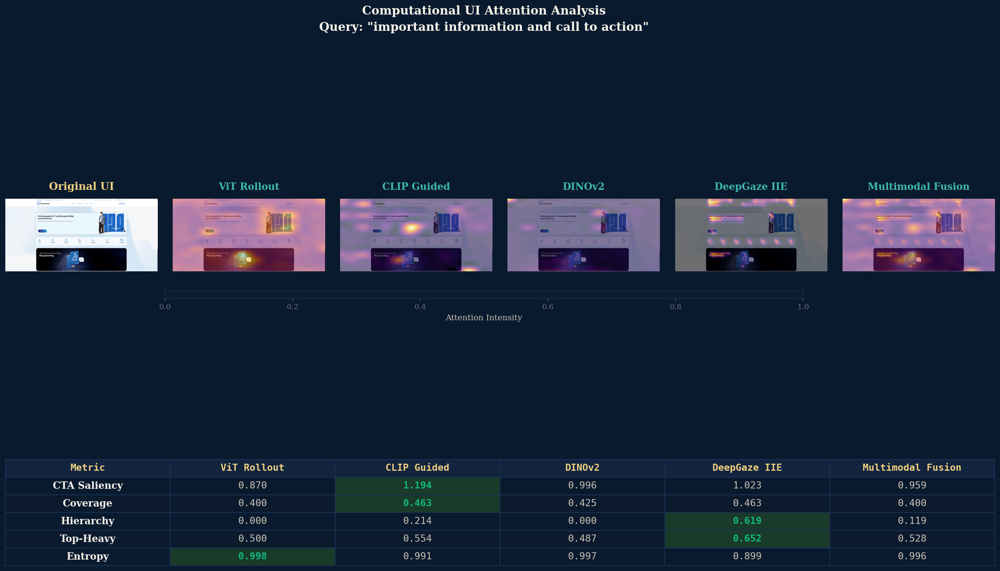

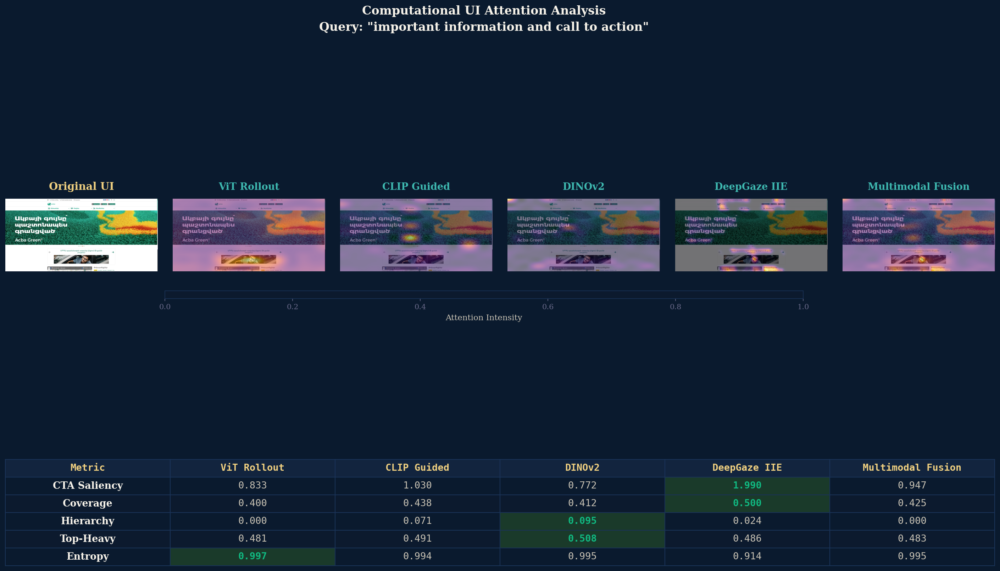

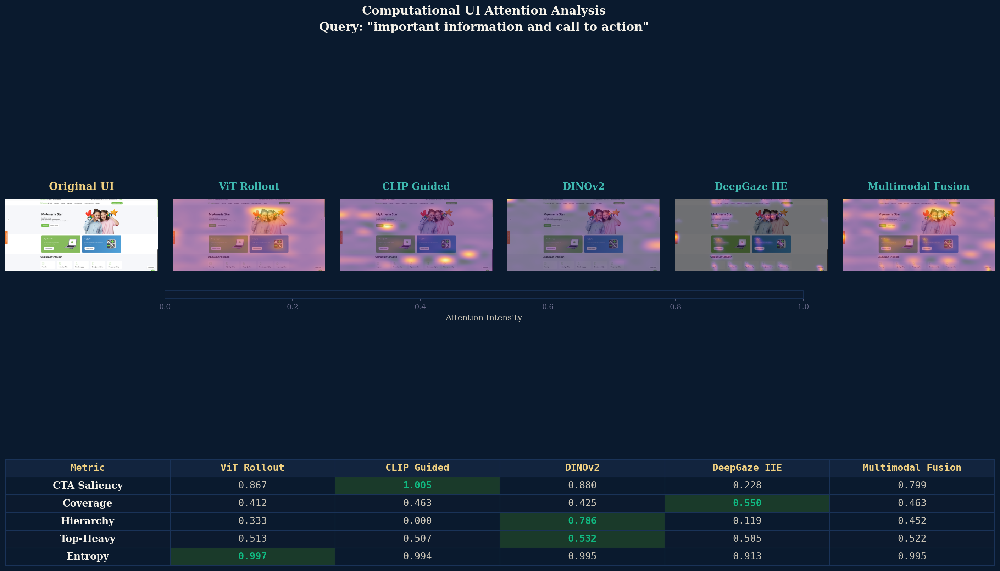

In [37]:
for label in images:
    generate_report(images[label], all_maps[label], all_metrics[label], TEXT_QUERY)

### Side-by-Side Comparison Across All Screenshots

All five models' heatmaps displayed together: Original + ViT Rollout + CLIP Guided + DINOv2 + DeepGaze IIE + Multimodal Fusion for each bank website.

/var/folders/4r/6fydpnls2mg8q1p98g9zqmy00000gn/T/ipykernel_1300/801042581.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap(STYLE["cmap"])


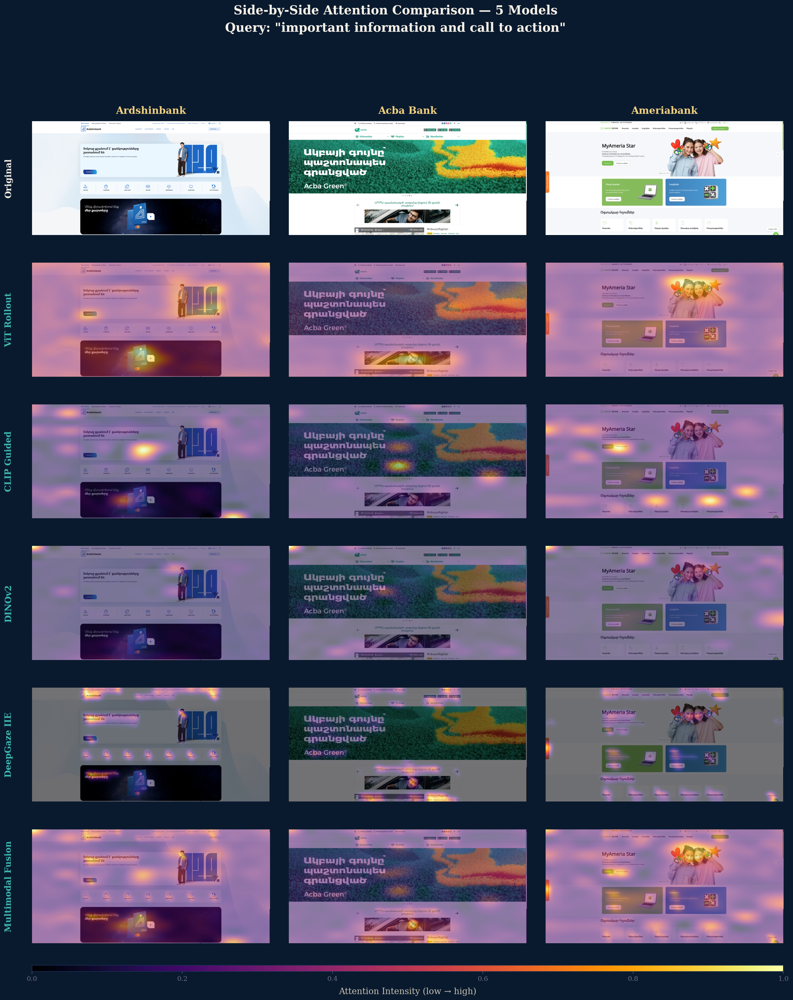

In [38]:
from matplotlib.gridspec import GridSpec
import matplotlib.cm as cm

labels = list(images.keys())
model_names = ["ViT Rollout", "CLIP Guided", "DINOv2", "DeepGaze IIE", "Multimodal Fusion"]
n_images = len(labels)
n_rows = len(model_names) + 1  # original + 5 models

fig = plt.figure(figsize=(22, 4.2 * n_rows))
gs = GridSpec(n_rows + 1, n_images, height_ratios=[1] * n_rows + [0.05],
              hspace=0.15, wspace=0.08)

# Row 0: Original screenshots
for col, label in enumerate(labels):
    ax = fig.add_subplot(gs[0, col])
    ax.imshow(images[label])
    ax.set_title(label, fontsize=STYLE["subtitle_size"], fontweight="bold",
                 color=STYLE["subtitle"], pad=12)
    ax.axis("off")
    if col == 0:
        ax.text(-0.08, 0.5, "Original", transform=ax.transAxes,
                fontsize=STYLE["label_size"], color=STYLE["title"],
                fontweight="bold", va="center", ha="right", rotation=90)

# Rows 1-5: Each model's heatmap overlay
for row, model_name in enumerate(model_names, start=1):
    for col, label in enumerate(labels):
        ax = fig.add_subplot(gs[row, col])
        overlay = create_heatmap_overlay(images[label], all_maps[label][model_name])
        ax.imshow(overlay)
        ax.axis("off")
        if col == 0:
            ax.text(-0.08, 0.5, model_name, transform=ax.transAxes,
                    fontsize=STYLE["label_size"], color=STYLE["accent"],
                    fontweight="bold", va="center", ha="right", rotation=90)

# Shared colorbar at bottom
cbar_ax = fig.add_subplot(gs[n_rows, :])
norm = plt.Normalize(0, 1)
sm = cm.ScalarMappable(cmap=STYLE["cmap"], norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation="horizontal")
cbar.set_label("Attention Intensity (low \u2192 high)", fontsize=STYLE["label_size"],
               color=STYLE["text"], labelpad=8)
cbar.ax.tick_params(colors=STYLE["text_dim"], labelsize=STYLE["tick_size"])
cbar.outline.set_edgecolor(STYLE["border"])

fig.suptitle(f'Side-by-Side Attention Comparison — 5 Models\nQuery: "{TEXT_QUERY}"',
             fontsize=STYLE["title_size"], fontweight="bold",
             color=STYLE["title"], y=0.98, linespacing=1.5)
plt.show()

### Comparative Metrics Table (Multimodal Fusion)

Compares all five UI attention metrics across the three bank websites using the combined multimodal model.

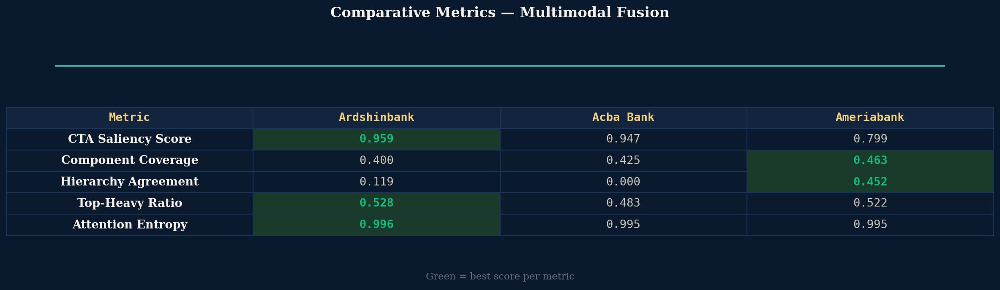

In [39]:
metric_labels = [
    "CTA Saliency Score", "Component Coverage", "Hierarchy Agreement",
    "Top-Heavy Ratio", "Attention Entropy",
]
metric_keys = [
    "cta_saliency_score", "component_coverage", "visual_hierarchy_agreement",
    "top_heavy_ratio", "attention_entropy",
]
labels = list(images.keys())
focus_model = "Multimodal Fusion"

# Build table data
table_data = []
for key, mlabel in zip(metric_keys, metric_labels):
    row = [mlabel]
    vals = [all_metrics[label][focus_model][key] for label in labels]
    for v in vals:
        row.append(f"{v:.3f}")
    table_data.append(row)

col_labels = ["Metric"] + labels

fig, ax = plt.subplots(figsize=(16, 5))
ax.axis("off")

table = ax.table(cellText=table_data, colLabels=col_labels,
                 loc="center", cellLoc="center")
table.auto_set_font_size(False)
table.set_fontsize(STYLE["table_size"])
table.scale(1.0, 2.2)

# Find best value per row
for row_idx, key in enumerate(metric_keys):
    vals = [all_metrics[label][focus_model][key] for label in labels]
    best_col = vals.index(max(vals)) + 1  # +1 for label column

    for col in range(len(col_labels)):
        cell = table[(row_idx + 1, col)]
        cell.set_edgecolor(STYLE["border"])

        if col == best_col:
            cell.set_facecolor("#1a3a2a")
            cell.set_text_props(color=STYLE["green"], fontweight="bold",
                                fontfamily="monospace")
        elif (row_idx + 1) % 2 == 0:
            cell.set_facecolor(STYLE["surface"])
            cell.set_text_props(color=STYLE["text"], fontfamily="monospace")
        else:
            cell.set_facecolor(STYLE["bg"])
            cell.set_text_props(color=STYLE["text"], fontfamily="monospace")

        if col == 0:
            cell.set_text_props(color=STYLE["title"], fontweight="bold",
                                fontfamily=STYLE["font_family"])

    # Header row
    for col in range(len(col_labels)):
        header = table[(0, col)]
        header.set_edgecolor(STYLE["border"])
        header.set_facecolor(STYLE["surface_alt"])
        header.set_text_props(color=STYLE["subtitle"], fontweight="bold",
                              fontfamily="monospace")

# Accent line at top
ax.plot([0.05, 0.95], [0.97, 0.97], transform=ax.transAxes,
        color=STYLE["accent"], linewidth=2, clip_on=False)

fig.suptitle(f"Comparative Metrics — {focus_model}",
             fontsize=STYLE["subtitle_size"], fontweight="bold",
             color=STYLE["title"], y=0.92)
ax.text(0.5, 0.02, "Green = best score per metric",
        transform=ax.transAxes, ha="center",
        fontsize=STYLE["tick_size"], color=STYLE["text_dim"])
plt.tight_layout(rect=[0, 0, 1, 0.88])
plt.show()

### Radar Chart Comparison

Visual comparison of all five metrics for each bank website (Multimodal Fusion model).

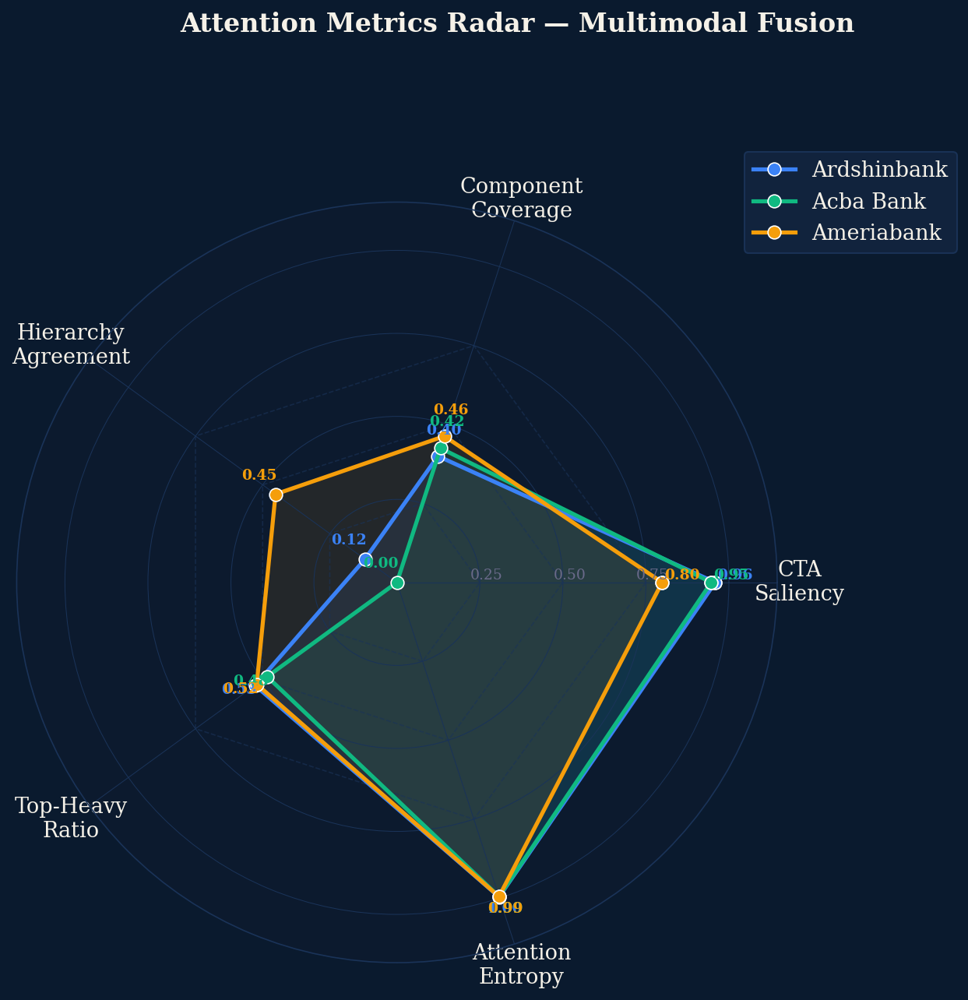

In [40]:
labels_list = list(images.keys())
focus_model = "Multimodal Fusion"
metric_keys = [
    "cta_saliency_score", "component_coverage",
    "visual_hierarchy_agreement", "top_heavy_ratio", "attention_entropy",
]
metric_short = ["CTA\nSaliency", "Component\nCoverage", "Hierarchy\nAgreement",
                "Top-Heavy\nRatio", "Attention\nEntropy"]
colors = [STYLE["blue"], STYLE["green"], STYLE["amber"]]

angles = np.linspace(0, 2 * np.pi, len(metric_keys), endpoint=False).tolist()
angles += angles[:1]

fig, ax = plt.subplots(figsize=(9, 9), subplot_kw=dict(polar=True))

# Reference bands
for ref_val in [0.25, 0.50, 0.75]:
    ax.plot(angles, [ref_val] * (len(metric_keys) + 1),
            color=STYLE["border"], linewidth=0.8, linestyle="--", alpha=0.6)
    ax.text(angles[0], ref_val + 0.02, f"{ref_val:.2f}",
            fontsize=STYLE["tick_size"] - 2, color=STYLE["text_dim"],
            ha="center", va="bottom")

# Data
for i, label in enumerate(labels_list):
    m = all_metrics[label][focus_model]
    values = [m[k] for k in metric_keys]
    values += values[:1]
    ax.plot(angles, values, "o-", linewidth=2.5, label=label,
            color=colors[i], markersize=8, markeredgecolor="white",
            markeredgewidth=0.8)
    ax.fill(angles, values, alpha=0.10, color=colors[i])

    # Value annotations
    for j, (angle, val) in enumerate(zip(angles[:-1], values[:-1])):
        offset = 0.06
        ax.text(angle, val + offset, f"{val:.2f}",
                fontsize=STYLE["tick_size"] - 2, color=colors[i],
                ha="center", va="bottom", fontweight="bold")

ax.set_xticks(angles[:-1])
ax.set_xticklabels(metric_short, fontsize=STYLE["label_size"] - 1,
                   color=STYLE["title"], linespacing=1.2)
ax.set_ylim(0, max(1.0, max(
    all_metrics[l][focus_model][k]
    for l in labels_list for k in metric_keys
) * 1.15))
ax.set_yticks([0.25, 0.50, 0.75, 1.0])
ax.set_yticklabels([])
ax.spines["polar"].set_color(STYLE["border"])
ax.grid(color=STYLE["border"], linewidth=0.5)

legend = ax.legend(loc="upper right", bbox_to_anchor=(1.25, 1.08),
                   fontsize=STYLE["label_size"] - 1,
                   framealpha=0.95, facecolor=STYLE["surface_alt"],
                   edgecolor=STYLE["border"])
for text in legend.get_texts():
    text.set_color(STYLE["title"])

fig.suptitle(f"Attention Metrics Radar — {focus_model}",
             fontsize=STYLE["subtitle_size"], fontweight="bold",
             color=STYLE["title"], y=0.98)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()

### Key Findings — Grouped Bar Chart

All five UI attention metrics compared across the three bank websites (Multimodal Fusion model) in a single presentation-ready figure.

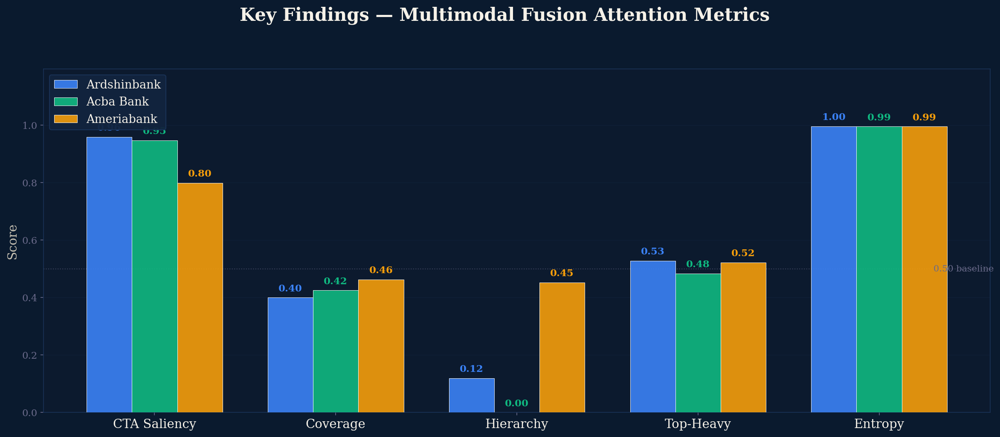

In [41]:
labels_list = list(images.keys())
focus_model = "Multimodal Fusion"
metric_keys = [
    "cta_saliency_score", "component_coverage",
    "visual_hierarchy_agreement", "top_heavy_ratio", "attention_entropy",
]
metric_short = ["CTA Saliency", "Coverage", "Hierarchy", "Top-Heavy", "Entropy"]
colors = [STYLE["blue"], STYLE["green"], STYLE["amber"]]

x = np.arange(len(metric_keys))
width = 0.25

fig, ax = plt.subplots(figsize=(16, 7))

for i, label in enumerate(labels_list):
    m = all_metrics[label][focus_model]
    vals = [m[k] for k in metric_keys]
    bars = ax.bar(x + i * width, vals, width, label=label,
                  color=colors[i], edgecolor="white", linewidth=0.5,
                  alpha=0.9, zorder=3)
    # Value labels on bars
    for bar, val in zip(bars, vals):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.015,
                f"{val:.2f}", ha="center", va="bottom",
                fontsize=STYLE["tick_size"], color=colors[i], fontweight="bold")

ax.set_xticks(x + width)
ax.set_xticklabels(metric_short, fontsize=STYLE["label_size"],
                   color=STYLE["title"])
ax.set_ylabel("Score", fontsize=STYLE["label_size"], color=STYLE["text"])
ax.set_ylim(0, max(
    all_metrics[l][focus_model][k]
    for l in labels_list for k in metric_keys
) * 1.2)
ax.tick_params(axis="y", labelsize=STYLE["tick_size"])
ax.grid(axis="y", alpha=0.3, zorder=0)
ax.set_axisbelow(True)

# Reference line at 0.5
ax.axhline(y=0.5, color=STYLE["text_dim"], linewidth=1, linestyle=":",
           alpha=0.5, zorder=1)
ax.text(x[-1] + 2.2 * width, 0.5, "0.50 baseline", fontsize=STYLE["tick_size"] - 1,
        color=STYLE["text_dim"], va="center")

legend = ax.legend(fontsize=STYLE["label_size"] - 1, loc="upper left",
                   framealpha=0.95, facecolor=STYLE["surface_alt"],
                   edgecolor=STYLE["border"])
for text in legend.get_texts():
    text.set_color(STYLE["title"])

fig.suptitle(f"Key Findings — {focus_model} Attention Metrics",
             fontsize=STYLE["title_size"], fontweight="bold",
             color=STYLE["title"], y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.94])
plt.show()

## Interpretation Guide

| Metric | Good | Potential Issue |
|--------|------|-----------------|
| **CTA Saliency Score** | > 1.5 (CTA gets more attention than average) | < 0.8 (CTA is under-attended) |
| **Component Coverage** | > 0.50 (well-distributed) | < 0.25 (narrowly concentrated) |
| **Visual Hierarchy Agreement** | > 0.60 (follows top-down pattern) | < 0.30 (confusing reading order) |
| **Top-Heavy Ratio** | > 0.55 (more attention above fold) | < 0.45 (critical content missed) |
| **Attention Entropy** | High = spread across areas | Low = concentrated in few hotspots |